In [1]:
import mpld3
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from sklearn.decomposition import PCA
from astropy.table import Table
import pandas as pd

In [2]:
# helpers
def flag_on(value, flag):
    return (value & flag) == flag

In [3]:
def bitfield(n):
    return [1 if digit=='1' else 0 for digit in bin(n)[2:]][::-1] # [2:] to chop off the "0b" part

bitfield(393216)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]

In [4]:
from itertools import zip_longest

def add_bitfields(x, y):
    return [a + b for (a, b) in zip_longest(x, y, fillvalue=0)]

print(bitfield(52))
print(bitfield(98))
add_bitfields(bitfield(52), bitfield(98))

[0, 0, 1, 0, 1, 1]
[0, 1, 0, 0, 0, 1, 1]


[0, 1, 1, 0, 1, 2, 1]

In [5]:
def add_integers_as_bitfields(x, y):
    return add_bitfields(bitfield(x), bitfield(y))

add_integers_as_bitfields(52, 98)

[0, 1, 1, 0, 1, 2, 1]

In [17]:
path = '/srv/scratch/astro/z3529659/eleanor-lite/s0003/0000/0000/1075/5798/hlsp_gsfc-eleanor-lite_tess_ffi_s0003-0000000010755798_tess_v1.0_lc.fits'
f = fits.open(path)
print(f[0].header['TIC_ID'])
a = Table.read(f[1])
a_pd = a.to_pandas()

10755798


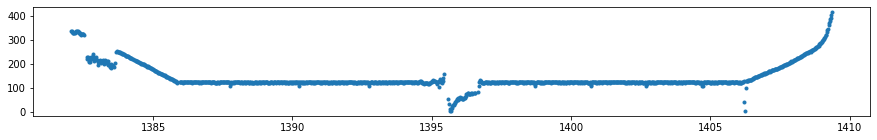

In [18]:
plt.figure(figsize=(15,2))
sf = a_pd['PCA_FLUX'].tolist()
t = a_pd['TIME'].tolist()

plt.plot(t, sf, '.')

In [19]:
type(a_pd['QUALITY'][0]) # numpy.int64
a_pd['QUALITY'][0].item()
bitfield(a_pd['QUALITY'][0])

[0, 0, 0, 0, 0, 0, 0, 1]

In [20]:
bin(a_pd['QUALITY'][0])

'0b10000000'

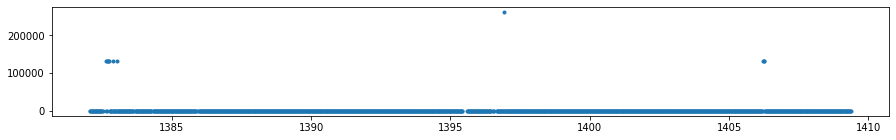

In [21]:
plt.figure(figsize=(15,2))
sf = a_pd['QUALITY'].tolist()
t = a_pd['TIME'].tolist()

plt.plot(t, sf, '.')

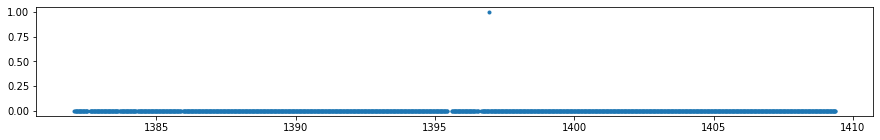

In [22]:
bit_18_list = [1 if flag_on(x, 2**18) else 0 for x in a_pd['QUALITY']]
plt.figure(figsize=(15,2))
t = a_pd['TIME'].tolist()

plt.plot(t, bit_18_list, '.')

In [12]:
def check_specific_flag(quality, flag_bit):
    return [1 if flag_on(x, 2**flag_bit) else 0 for x in quality]

In [13]:
# Create a dataset of all the lightcurves in s0017/0000/0000/05*
mask = 0
data_dict = {}
quality_flags = []
for path in glob('/srv/scratch/astro/z3529659/eleanor-lite/s0003/0000/0000/10*/*/*.fits'):
    with fits.open(path) as fits_file:
        # series = pd.Series(fits_data[1].data['SAP_FLUX'].byteswap().newbyteorder(), index=fits_data[1].data['TIME'])
        dat = Table.read(fits_file[1])
        pd_dat = dat.to_pandas()

        data_dict[f"TIC {fits_file[0].header['TIC_ID']}"] = pd_dat['PCA_FLUX']/np.nanmedian(pd_dat['PCA_FLUX'])
        quality_flags.append(pd_dat['QUALITY'])
df = pd.DataFrame(data_dict)


In [14]:
df.shape[1]

6972

In [15]:
bit_18_aggregate = []
for quality in quality_flags:
    bit_18_aggregate = add_bitfields(bit_18_aggregate, check_specific_flag(quality, 18))

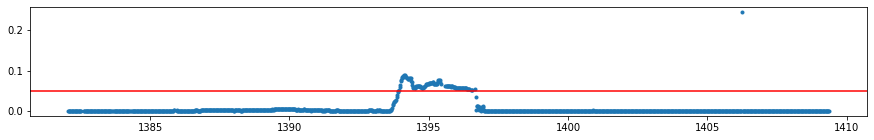

In [23]:
plt.figure(figsize=(15,2))

plt.plot(a_pd['TIME'].tolist(), list(map(lambda x: x / df.shape[1], bit_18_aggregate)), '.')
plt.axhline(y=0.05, color='r', linestyle='-')

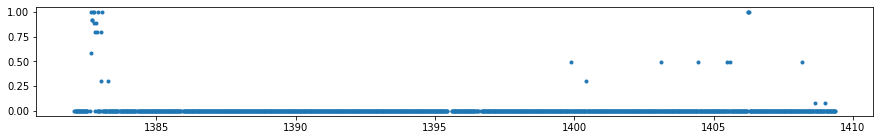

In [24]:
bit_17_aggregate = []
for quality in quality_flags:
    bit_17_aggregate = add_bitfields(bit_17_aggregate, check_specific_flag(quality, 17))
plt.figure(figsize=(15,2))

plt.plot(a_pd['TIME'].tolist(), list(map(lambda x: x / df.shape[1], bit_17_aggregate)), '.')

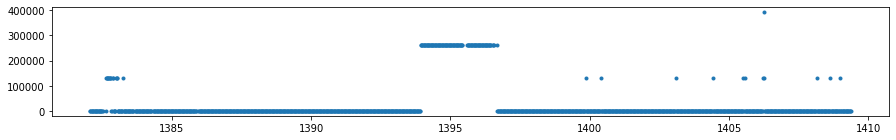

In [25]:
overall_quality = [0] * len(quality_flags[0])
for bit_num in range(19):
    bit_aggregate = []
    for quality in quality_flags:
        bit_aggregate = add_bitfields(bit_aggregate, check_specific_flag(quality, bit_num))
        
    for (i, x) in enumerate(bit_aggregate):
        if x / df.shape[1] > 0.05:
            overall_quality[i] |= 2**bit_num
            
            
plt.figure(figsize=(15,2))

plt.plot(a_pd['TIME'].tolist(), overall_quality, '.')

In [26]:
df

,TIC 10879823,TIC 10879507,TIC 10879248,TIC 10879697,TIC 10879822,TIC 10879560,TIC 10879807,TIC 10879789,TIC 10879558,TIC 10879298,...,TIC 10762128,TIC 10762012,TIC 10762626,TIC 10761642,TIC 10761287,TIC 10762683,TIC 10763128,TIC 10761918,TIC 10761521,TIC 10762373
0,0.933365,1.540917,4.469787,1.903833,3.580483,4.413020,2.071369,0.976875,2.110874,1.466976,...,3.215730,1.753749,0.945465,1.239358,4.033614,0.468430,2.214921,0.445432,-0.958560,3.504234
1,0.945195,1.542806,4.458057,1.903962,3.567357,4.417636,2.065488,1.011801,2.106921,1.470155,...,3.124415,1.727536,0.946705,1.257396,3.991998,0.462935,2.201691,0.303465,-1.159963,3.493593
2,0.954359,1.547801,4.442733,1.901290,3.561092,4.395399,2.067341,0.982478,2.101486,1.472692,...,3.098109,1.710043,0.947399,1.282241,3.957130,0.460442,2.196803,0.293660,-1.452426,3.482376
3,0.931881,1.553920,4.424234,1.899482,3.547548,4.378249,2.062238,1.027311,2.098517,1.475059,...,3.131956,1.698174,0.948541,1.307395,3.944437,0.472835,2.192568,0.262358,-1.777153,3.477439
4,0.949859,1.551242,4.409104,1.893756,3.539578,4.362435,2.056961,1.022698,2.091877,1.468729,...,3.142663,1.685947,0.948875,1.325456,3.915803,0.492509,2.181803,0.254496,-2.078631,3.465698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1283,1.547806,1.309114,4.416932,1.671597,3.182021,3.924625,2.059621,0.906965,1.843987,1.407258,...,2.880529,1.930550,0.813736,0.890736,3.483298,-2.315987,2.080753,2.286232,-0.180625,2.974597
1284,1.614879,1.321369,4.487143,1.680526,3.213784,3.931423,2.084304,0.869849,1.852049,1.412991,...,3.102132,1.949267,0.811446,0.895435,3.492120,-2.309842,2.085520,2.524171,-0.190787,3.006470
1285,1.771594,1.333341,4.554015,1.692782,3.252874,3.976258,2.106726,0.948930,1.860032,1.416771,...,3.243933,1.975201,0.812630,0.901795,3.509561,-2.356132,2.078001,2.628078,-0.227621,3.026200
1286,1.869341,1.334643,4.613482,1.695645,3.293330,3.986666,2.127642,0.806632,1.864274,1.423743,...,3.419647,2.006101,0.811335,0.914076,3.535031,-2.387099,2.099374,2.682809,-0.335250,3.041619


In [27]:
df.shape

(1288, 6972)

In [28]:
df_masked = df[pd.Series(overall_quality) == 0]

In [29]:
df_masked.shape

(742, 6972)

In [30]:
from sklearn.impute import SimpleImputer
imp_constant = SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=1)
imputed_sample = imp_constant.fit_transform(df_masked.transpose())

In [31]:
pca = PCA(n_components=50)
sample_after_pca = pca.fit(imputed_sample).transform(imputed_sample)

In [32]:
sample_after_pca.shape

(6972, 50)

In [33]:
pca.explained_variance_ratio_

array([0.19894332, 0.10840226, 0.08456994, 0.0660829 , 0.06141663,
       0.04537143, 0.03393875, 0.03133879, 0.03042976, 0.02936598,
       0.02475053, 0.01501231, 0.01167047, 0.01113432, 0.00914398,
       0.00791047, 0.0074886 , 0.00710512, 0.00640765, 0.00638198,
       0.00553284, 0.00520059, 0.00484044, 0.0046294 , 0.0038114 ,
       0.0037266 , 0.00347943, 0.00331104, 0.00312999, 0.00307001,
       0.00283543, 0.00282804, 0.00266977, 0.00258037, 0.00251299,
       0.00240867, 0.00222513, 0.00213467, 0.0020867 , 0.00194529,
       0.00188653, 0.00177592, 0.00168905, 0.00156729, 0.00148341,
       0.00143963, 0.00137878, 0.00118675, 0.00105649, 0.00101411])

In [34]:
from sklearn import manifold

In [35]:
perplexity = 50
tsne = manifold.TSNE(
    n_components=2,
    init='pca',
    random_state=0,
    perplexity=perplexity,
    learning_rate='auto',
)
sample_after_tsne = tsne.fit_transform(sample_after_pca)

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [36]:
sample_after_tsne.shape

(6972, 2)

In [37]:
labels = list(df.columns)
fig = plt.figure()
scatter = plt.scatter(
    sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
)

plt.title("tSNE of lightcurves in s0001/0000/0000/24*")

tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
mpld3.plugins.connect(fig, tooltip)

mpld3.display()

See TIC 24293868 at around (60, -5).

In [38]:
perplexity = 20
tsne = manifold.TSNE(
    n_components=2,
    init='pca',
    random_state=5,
    perplexity=perplexity,
    learning_rate='auto',
)
sample_after_tsne = tsne.fit_transform(sample_after_pca)

labels = list(df.columns)
fig = plt.figure()
scatter = plt.scatter(
    sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
)

plt.title("tSNE of lightcurves in s0001/0000/0000/24*")

tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
mpld3.plugins.connect(fig, tooltip)

mpld3.display()

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


This has recovered the same outlier as PCA, TIC 24293868, at around point (73, 35).

In [39]:
perplexity = 35
tsne = manifold.TSNE(
    n_components=2,
    init='pca',
    random_state=5,
    perplexity=perplexity,
    learning_rate='auto',
)
sample_after_tsne = tsne.fit_transform(sample_after_pca)

labels = list(df.columns)
fig = plt.figure()
scatter = plt.scatter(
    sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
)

plt.title("tSNE of lightcurves in s0001/0000/0000/24*")

tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
mpld3.plugins.connect(fig, tooltip)

mpld3.display()

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [40]:
perplexity = 70
tsne = manifold.TSNE(
    n_components=2,
    init='pca',
    random_state=5,
    perplexity=perplexity,
    learning_rate='auto',
)
sample_after_tsne = tsne.fit_transform(sample_after_pca)

labels = list(df.columns)
fig = plt.figure()
scatter = plt.scatter(
    sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
)

plt.title("tSNE of lightcurves in s0001/0000/0000/24*")

tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
mpld3.plugins.connect(fig, tooltip)

mpld3.display()

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [41]:
perplexity = 10
tsne = manifold.TSNE(
    n_components=2,
    init='pca',
    random_state=5,
    perplexity=perplexity,
    learning_rate='auto',
)
sample_after_tsne = tsne.fit_transform(sample_after_pca)

labels = list(df.columns)
fig = plt.figure()
scatter = plt.scatter(
    sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
)

plt.title("tSNE of lightcurves in s0001/0000/0000/24*")

tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
mpld3.plugins.connect(fig, tooltip)

mpld3.display()

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [42]:
perplexity = 200
tsne = manifold.TSNE(
    n_components=2,
    init='pca',
    random_state=5,
    perplexity=perplexity,
    learning_rate='auto',
)
sample_after_tsne = tsne.fit_transform(sample_after_pca)

labels = list(df.columns)
fig = plt.figure()
scatter = plt.scatter(
    sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
)

plt.title("tSNE of lightcurves in s0001/0000/0000/24*")

tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
mpld3.plugins.connect(fig, tooltip)

mpld3.display()

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [43]:
perplexity = 6
tsne = manifold.TSNE(
    n_components=2,
    init='pca',
    random_state=5,
    perplexity=perplexity,
    learning_rate='auto',
)
sample_after_tsne = tsne.fit_transform(sample_after_pca)

labels = list(df.columns)
fig = plt.figure()
scatter = plt.scatter(
    sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
)

plt.title("tSNE of lightcurves in s0001/0000/0000/24*")

tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
mpld3.plugins.connect(fig, tooltip)

mpld3.display()

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [45]:
(fig, subplots) = plt.subplots(3, 3, figsize=(15, 8))
perplexities = [5, 10, 20, 30, 40, 50, 70, 100]
labels = list(df.columns)

for i, perplexity in enumerate(perplexities):
    row, col = divmod(i, 3)
    ax = subplots[row][col]
    tsne = manifold.TSNE(
        n_components=2,
        init='pca',
        random_state=5,
        perplexity=perplexity,
        learning_rate='auto',
    )
    sample_after_tsne = tsne.fit_transform(sample_after_pca)
    
    scatter = ax.scatter(
        sample_after_tsne[:, 0], sample_after_tsne[:, 1], s=5, label=labels
    )
    ax.set_title(f'Perplexity={perplexity}')
    tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
    mpld3.plugins.connect(fig, tooltip)
plt.tight_layout()
mpld3.display()

/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/home/z5260889/.venvs/tess-anomalies-jupyter/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to hav